TxTSAM - Text Prompt Based Segment Anything

Uses GroundingDINO + SAM

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1zq8jcZkDK8vVVbe-BhPZQFxCe_kknUUi?usp=sharing)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

!mkdir -p images
!wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
!wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/groceries.jpg

!mkdir -p ../checkpoints/
!wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

PyTorch version: 2.8.0+cu126
Torchvision version: 0.23.0+cu126
CUDA is available: True
  Cloning https://github.com/facebookresearch/sam2.git to /tmp/pip-req-build-s0p2bb0n
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/sam2.git /tmp/pip-req-build-s0p2bb0n
  Resolved https://github.com/facebookresearch/sam2.git to commit 2b90b9f5ceec907a1c18123530e92e794ad901a4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.8 MB/s eta 0:00:00
  Created wheel for SAM-2: filename=sam_2-1.0-cp312-cp312-linux_x86_64.whl size=473728 sha256=0edc9ea2b71d4102f816e6cb3abe84c257e393d1e736ed786df1860b1187c8cd
  Stored in directory: /tmp/pip-ephem-wheel-cache-c57txld8/wheels/25/a3/8a/abd69dc6a6926b5e75c24

In [2]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [3]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


# Inference - Image


In [ ]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection, infer_device
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor


class TXT_SAM_Image:
    def __init__(self,
                 sam2_checkpoint: str = "../checkpoints/sam2.1_hiera_large.pt",
                 model_cfg: str = "configs/sam2.1/sam2.1_hiera_l.yaml",
                 dino_model_id: str = "IDEA-Research/grounding-dino-tiny"):
        self.device = infer_device()
        sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=self.device)
        self.predictor = SAM2ImagePredictor(sam2_model)
        self.processor = AutoProcessor.from_pretrained(dino_model_id)
        self.dino_model = AutoModelForZeroShotObjectDetection.from_pretrained(dino_model_id).to(self.device)

    @staticmethod
    def show_mask(mask, ax, random_color: bool = False, borders: bool = True):
        if random_color:
            color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
        else:
            color = np.array([30/255, 144/255, 255/255, 0.6])
        h, w = mask.shape[-2:]
        mask = mask.astype(np.uint8)
        mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
        if borders:
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            contours = [cv2.approxPolyDP(c, epsilon=0.01, closed=True) for c in contours]
            mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
        ax.imshow(mask_image)

    @staticmethod
    def show_points(coords, labels, ax, marker_size: int = 375):
        pos_points = coords[labels == 1]
        neg_points = coords[labels == 0]
        ax.scatter(pos_points[:, 0], pos_points[:, 1], color="green", marker="*", s=marker_size,
                   edgecolor="white", linewidth=1.25)
        ax.scatter(neg_points[:, 0], neg_points[:, 1], color="red", marker="*", s=marker_size,
                   edgecolor="white", linewidth=1.25)

    @staticmethod
    def show_box(box, ax):
        x0, y0, x1, y1 = box
        w, h = x1 - x0, y1 - y0
        ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor="green",
                                   facecolor=(0, 0, 0, 0), lw=2))

    @classmethod
    def show_masks(cls, image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
        for i, (mask, score) in enumerate(zip(masks, scores)):
            plt.figure(figsize=(10, 10))
            plt.imshow(image)
            cls.show_mask(mask, plt.gca(), borders=borders)
            if point_coords is not None:
                assert input_labels is not None
                cls.show_points(point_coords, input_labels, plt.gca())
            if box_coords is not None:
                cls.show_box(box_coords, plt.gca())
            if len(scores) > 1:
                plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
            plt.axis("off")
            plt.show()

    def ground_dino(self, image, text_labels, box_threshold=0.4, text_threshold=0.3):
        inputs = self.processor(images=image, text=text_labels, return_tensors="pt").to(self.device)
        with torch.no_grad():
            outputs = self.dino_model(**inputs)
        results = self.processor.post_process_grounded_object_detection(
            outputs,
            inputs.input_ids,
            threshold=box_threshold,
            text_threshold=text_threshold,
            target_sizes=[image.size[::-1]],
        )
        boxes = []
        for box, score, label in zip(results[0]["boxes"], results[0]["scores"], results[0]["labels"]):
            box = [float(x) for x in box.tolist()]
            boxes.append(box)
            print(f"Detected {label} with confidence {round(score.item(), 3)} at location {box}")
        return np.array(boxes)

    def forward_pass(self, image, boxes, multimask_output: bool = False):
        self.predictor.set_image(image)
        if not isinstance(boxes, np.ndarray):
            boxes = np.array(boxes, dtype=np.float32)

        masks, scores, _ = self.predictor.predict(
            point_coords=None,
            point_labels=None,
            box=boxes,
            multimask_output=multimask_output,
        )

        plt.figure(figsize=(10, 10))
        plt.imshow(image)

        for mask in masks:
            self.show_mask(mask.squeeze(0), plt.gca(), random_color=True)

        for box in boxes:
            self.show_box(box, plt.gca())

        plt.axis("off")
        plt.show()

        return masks, scores


Detected cat with confidence 0.793 at location [345.70745849609375, 24.122699737548828, 639.1729125976562, 372.7372741699219]
Detected cat with confidence 0.829 at location [9.29814338684082, 54.6176872253418, 316.2046813964844, 475.17266845703125]


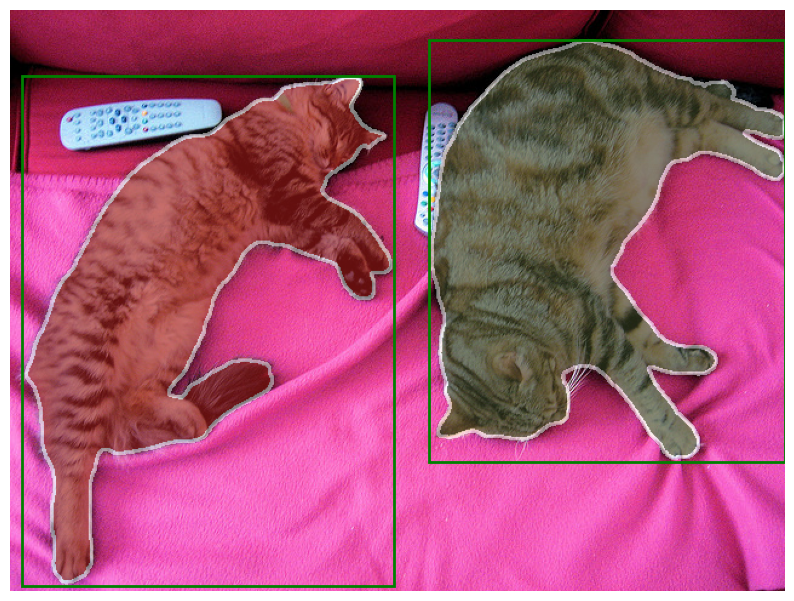

Generated 2 masks with scores: [[0.984375]
 [0.984375]]


In [ ]:
import requests

device = infer_device()

image_url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(image_url, stream=True).raw)
txt_sam = TXT_SAM_Image(
    sam2_checkpoint="../checkpoints/sam2.1_hiera_large.pt",
    model_cfg="configs/sam2.1/sam2.1_hiera_l.yaml",
    dino_model_id="IDEA-Research/grounding-dino-tiny"
)

text_prompts = ["cat"]
boxes = txt_sam.ground_dino(image, text_prompts)
masks, scores = txt_sam.forward_pass(image, boxes, multimask_output=False)
print(f"Generated {len(masks)} masks with scores: {scores}")

## Inference - Video

In [25]:
import os
import cv2
import numpy as np
import matplotlib
matplotlib.use('Agg') # Set the backend here
import matplotlib.pyplot as plt
from PIL import Image
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from sam2.build_sam import build_sam2_video_predictor


class TXT_SAM_Video:
    def __init__(
        self,
        sam2_checkpoint: str = "../checkpoints/sam2.1_hiera_large.pt",
        model_cfg: str = "configs/sam2.1/sam2.1_hiera_l.yaml",
        dino_model_id: str = "IDEA-Research/grounding-dino-tiny"
    ):
        self.device = "cuda"
        self.processor = AutoProcessor.from_pretrained(dino_model_id)
        self.dino_model = AutoModelForZeroShotObjectDetection.from_pretrained(dino_model_id).to(self.device)
        self.predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=self.device)

    @staticmethod
    def show_mask(mask, ax, obj_id= None, random_color=False):
        if random_color:
            color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
        else:
            cmap = plt.get_cmap("tab10")
            cmap_idx = 0 if obj_id is None else obj_id
            color = np.array([*cmap(cmap_idx)[:3], 0.6])
        h, w = mask.shape[-2:]
        mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
        ax.imshow(mask_image)

    @staticmethod
    def show_points(coords, labels, ax, marker_size= 200):
        pos_points = coords[labels == 1]
        neg_points = coords[labels == 0]
        ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size,
                   edgecolor='white', linewidth=1.25)
        ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size,
                   edgecolor='white', linewidth=1.25)

    @staticmethod
    def show_box(box, ax):
        x0, y0 = box[0], box[1]
        w, h = box[2] - box[0], box[3] - box[1]
        ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

    @staticmethod
    def extract_frames(video_path, output_folder):
        os.makedirs(output_folder, exist_ok=True)
        cap = cv2.VideoCapture(video_path)
        frame_count = 0
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame_filename = os.path.join(output_folder, f"{frame_count}.jpg")
            cv2.imwrite(frame_filename, frame)
            frame_count += 1
        cap.release()
        print(f"Frames saved to '{output_folder}'")

    @staticmethod
    def load_frame(folder_path, frame_index) -> Image.Image:
        frame_path = os.path.join(folder_path, f"{frame_index}.jpg")
        return Image.open(frame_path)

    def process_frame(
        self,
        frame_folder,
        text_labels,
        frame_idx=0,
        obj_id=0,
        threshold=0.4,
        text_threshold=0.3
    ):
        frame_path = os.path.join(frame_folder, f"{frame_idx}.jpg")
        if not os.path.exists(frame_path):
            raise FileNotFoundError(f"Frame not found: {frame_path}")

        image = Image.open(frame_path)
        inference_state = self.predictor.init_state(video_path=frame_folder)
        inputs = self.processor(images=image, text=text_labels, return_tensors="pt").to(self.device)

        with torch.no_grad():
            outputs = self.dino_model(**inputs)

        results = self.processor.post_process_grounded_object_detection(
            outputs,
            inputs.input_ids,
            threshold=threshold,
            text_threshold=text_threshold,
            target_sizes=[image.size[::-1]]
        )

        result = results[0]
        boxes = []
        for box, score, labels in zip(result["boxes"], result["scores"], result["labels"]):
            box = [round(x, 2) for x in box.tolist()]
            boxes.append(box)
            print(f"Detected {labels} with confidence {round(score.item(), 3)} at location {box}")

        if not boxes:
            print("No objects detected.")
            return

        box = boxes[0]
        _, out_obj_ids, out_mask_logits = self.predictor.add_new_points_or_box(
            inference_state=inference_state,
            frame_idx=frame_idx,
            obj_id=obj_id,
            box=box,
        )

        plt.figure(figsize=(9, 6))
        plt.title(f"Frame {frame_idx}")
        plt.imshow(image)
        self.show_box(box, plt.gca())
        self.show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])
        plt.show()

        return inference_state


    def propagate_video(
        self,
        inference_state,
        frame_folder,
        frame_names,
        output_video_path="./segmented_output.mp4",
        vis_frame_stride=60,
        fps=30
    ):
        video_segments = {}
        for out_frame_idx, out_obj_ids, out_mask_logits in self.predictor.propagate_in_video(inference_state):
            video_segments[out_frame_idx] = {
                out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
                for i, out_obj_id in enumerate(out_obj_ids)
            }

        first_frame = np.array(Image.open(os.path.join(frame_folder, frame_names[0])))
        height, width = first_frame.shape[:2]
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

        plt.close("all")
        for out_frame_idx in range(len(frame_names)):
            frame_path = os.path.join(frame_folder, frame_names[out_frame_idx])
            frame = np.array(Image.open(frame_path))
            frame_rgb = frame.copy()

            if out_frame_idx in video_segments:
                for out_obj_id, out_mask in video_segments[out_frame_idx].items():
                    mask = (out_mask * 255).astype(np.uint8)
                    color = np.array([0,0,255], dtype=np.uint8)
                    colored_mask = np.zeros_like(frame_rgb)
                    for c in range(3):
                        colored_mask[:, :, c] = mask * (color[c] / 255)
                    alpha = 0.5
                    frame_rgb = cv2.addWeighted(frame_rgb, 1.0, colored_mask, alpha, 0)

            if out_frame_idx % vis_frame_stride == 0:
                plt.figure(figsize=(6, 4))
                plt.title(f"Frame {out_frame_idx}")
                plt.imshow(frame_rgb)
                plt.show()
                plt.close()

            frame_bgr = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
            video_writer.write(frame_bgr)

        video_writer.release()
        print(f"Segmented video saved at: {output_video_path}")


In [23]:
!pip install yt-dlp
!yt-dlp -f mp4 -o 'dog.mp4' "https://youtube.com/shorts/3H5iaDnW8sM?si=QVCS6CayUJkgR7up"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.9/175.9 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 84.7 MB/s eta 0:00:00
         Pre-merged mp4 formats are not available from all sites, or may only be available in lower quality.
         To prioritize the best h264 video and aac audio in an mp4 container, use "-t mp4" instead.
         If you know what you are doing and want a pre-merged mp4 format, use "-f b[ext=mp4]" instead to suppress this warning
[youtube] Extracting URL: https://youtube.com/shorts/3H5iaDnW8sM?si=QVCS6CayUJkgR7up
[youtube] 3H5iaDnW8sM: Downloading webpage
[youtube] 3H5iaDnW8sM: Downloading tv client config
[youtube] 3H5iaDnW8sM: Downloading tv player API JSON
[youtube] 3H5iaDnW8sM: Downloading web safari player API JSON
[youtube] 3H5iaDnW8sM: Downloading player 0004de42-main
[youtube] 3H5iaDnW8sM: Downloading m3u8 information
[info] 3H5iaDnW8sM: Downloading 1 format(s): 96
[download] Sleeping 2.00 seconds as required by the si

In [26]:
import os
import torch

sam_video = TXT_SAM_Video(
    sam2_checkpoint="../checkpoints/sam2.1_hiera_large.pt",
    model_cfg="configs/sam2.1/sam2.1_hiera_l.yaml",
    dino_model_id="IDEA-Research/grounding-dino-tiny"
)

video_path = "./dog.mp4"
frame_output_folder = "./frames"
text_labels = [["a dog"]]
frame_idx = 0
obj_id = 0
output_video_path = "./segmented_output.mp4"
vis_frame_stride = 60
fps = 30

os.makedirs(frame_output_folder, exist_ok=True)
sam_video.extract_frames(video_path, frame_output_folder)

frame_names = sorted(
    [p for p in os.listdir(frame_output_folder) if os.path.splitext(p)[-1].lower() in [".jpg", ".jpeg"]],
    key=lambda p: int(os.path.splitext(p)[0])
)
print(f"Total frames extracted: {len(frame_names)}")

inference_state = sam_video.process_frame(
    frame_folder=frame_output_folder,
    text_labels=text_labels,
    frame_idx=frame_idx,
    obj_id=obj_id
)

sam_video.propagate_video(
    inference_state=inference_state,
    frame_folder=frame_output_folder,
    frame_names=frame_names,
    output_video_path=output_video_path,
    vis_frame_stride=vis_frame_stride,
    fps=fps
)

print("Segmentation pipeline completed!")


Frames saved to './frames'
Total frames extracted: 282


frame loading (JPEG): 100%|██████████| 282/282 [00:20<00:00, 13.63it/s]
/usr/local/lib/python3.12/dist-packages/transformers/models/grounding_dino/processing_grounding_dino.py:94: FutureWarning: The key `labels` is will return integer ids in `GroundingDinoProcessor.post_process_grounded_object_detection` output since v4.51.0. Use `text_labels` instead to retrieve string object names.
  warnings.warn(self.message, FutureWarning)


Detected a dog with confidence 0.946 at location [616.22, 557.68, 976.3, 993.52]


propagate in video: 100%|██████████| 282/282 [05:10<00:00,  1.10s/it]


Segmented video saved at: ./segmented_output.mp4
Segmentation pipeline completed!


In [28]:
from IPython.display import HTML
from base64 import b64encode

video_path = "segmented_output.mp4"

mp4 = open(video_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=640 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")
